### Analysis and plotting

In [1]:
import pandas as pd
import numpy as np
import xarray as xr
import os
import glob

# for plotting
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from matplotlib_scalebar.scalebar import ScaleBar
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
%matplotlib inline

# for plotting ASTER geotiffs
import rasterio as rio
import rasterio.plot as rioplt
from rasterio.warp import calculate_default_transform

# for working with raster data
import rioxarray

# for shapefile
import geopandas as gpd

# for MODIS conversions
import modis_utils

# for calculating zonal statistics
import aster_utils

import warnings
warnings.filterwarnings('ignore')

In [2]:
def nearest(items, pivot):
    # https://stackoverflow.com/questions/32237862/find-the-closest-date-to-a-given-date
    return min(items, key=lambda x: abs(x - pivot))

Set font sizes for plots

In [3]:
SMALL_SIZE = 12
MEDIUM_SIZE = 16
BIGGER_SIZE = 18

plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=BIGGER_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title

---
## Open data files

Open our merged GOES-CUES point timeseries dataset

In [4]:
cues_ds = pd.read_pickle('data/goes-cues_2017-2020.pkl')
cues_ds = cues_ds.to_xarray()

Load MODIS timeseries of the CUES site

In [5]:
#modis_1 = pd.read_pickle('./MODIS_data/cues_2017_1-59.pkl')
#modis_2 = pd.read_pickle('./MODIS_data/cues_2017_60-120.pkl')
#
## Concatenate the two MODIS time series together
#modis = pd.concat([modis_1, modis_2], ignore_index=True)

Get filepaths for orthorectified GOES images

In [6]:
goes_directory = "/storage/GOES/orthorectified"
ortho_goes_filelist = glob.glob(goes_directory + '/**/*.tif', recursive=True)#getListOfFiles(goes_directory)

Get filepaths for ASTER images

In [7]:
aster_directory = "/storage/spestana/ASTER/AST_L1T/geotiff/T/T_band14_Tuolumne-and-CUES/"
# Find all our ASTER files and their timestamps in our directory
aster = aster_utils.aster_timestamps(aster_directory, ext='tif')
# add a UTC-8 datetime for pacific standard that CUES uses
aster['datetime'] = aster.timestampUTC - pd.Timedelta(hours=8)
# save a csv file of the ASTER files we are using
#aster.to_csv('aster_AST_L1T_band14_Tuolumne-and-CUES.csv')

Find the GOES observations at the same time as ASTER

In [8]:
# create an empty dictionary we'll fill with filenames and timestamps for each subdirectory we search
goes_dict = {}
    

aster_counter = 0
# for every ASTER datetime (in UTC)
for aster_datetime_UTC in aster.timestampUTC:
    # count
    aster_counter += 1
    #print('\n\n File {} of {}'.format(aster_counter, aster.shape[0]))
    #print('\nFor ASTER observation at {}'.format(aster_datetime_UTC))
    # find the GOES subdirectory for the corresponding year-month-day and hour
    goes_subdir = r"/{year}/{month}/{day}/{product}/{hour}/{channel}/".format(
                            goes_directory=goes_directory, 
                            year=aster_datetime_UTC.strftime('%Y'), 
                            month=aster_datetime_UTC.strftime('%m'), 
                            day=aster_datetime_UTC.day, 
                            product='ABI-L1b-RadC', 
                            hour=aster_datetime_UTC.strftime('%H'), 
                            channel='C14')
    # now within this subdirectory, the same hour of this ASTER observation
    #print('\nSearching for GOES ABI imagery within:\n{}{}'.format(goes_directory,goes_subdir))
    # get the filenames of each GOES ABI image in this subdirectory
    goes_files = glob.glob(goes_directory+goes_subdir+'*.tif')
    goes_datetimes_UTC_list = []
    goes_files_list = []
    

    for this_goes_file in goes_files:

        this_goes_filename = os.path.normpath(this_goes_file).split('\\')[-1]
        if this_goes_filename.split('.')[-1] == 'tif':
            
            # parse the timstamp in the filename 
            this_goes_datetime_UTC = this_goes_filename.split('_')[-2].split('.')[0][1:-1]
            #print(this_goes_datetime_UTC)
            this_goes_datetime_UTC = pd.to_datetime(this_goes_datetime_UTC, format="%Y%j%H%M%S")
            this_goes_datetime_UTC = pd.Timestamp(this_goes_datetime_UTC, tz='UTC')
            #print('\t{}'.format(this_goes_datetime_UTC))

            # add these to our dictionary, use the date as the key
            goes_dict[this_goes_datetime_UTC] = {}
            goes_dict[this_goes_datetime_UTC]['filepath'] = this_goes_file

Get filepaths for the MODIS observations I've created NetCDF files for, and their corresponding timestamps:

In [9]:
# search for MODIS files in this directory
modis_dir = '/storage/MODIS/Tuolumne_MOD021KM/'
# get .tif files here
modis_filelist = glob.glob(modis_dir + '*.tif', recursive=True)

# create an empty dictionary we'll fill with filenames and timestamps for each modis image we have
modis_dict = {}

for this_modis_file in modis_filelist:
    # get just the filename
    this_modis_filename = os.path.normpath(this_modis_file).split('/')[-1]
    # then parse the year, day of year, hour, and minutes from the filename
    this_modis_date_time = this_modis_filename.split('.')[1] + this_modis_filename.split('.')[2]
    this_modis_timestampUTC = pd.to_datetime(this_modis_date_time[1:], format="%Y%j%H%M")
    this_modis_timestampUTC = pd.Timestamp(this_modis_timestampUTC, tz='UTC') #also specify UTC
    # add these to our dictionary, use the date as the key
    modis_dict[this_modis_timestampUTC] = {}
    modis_dict[this_modis_timestampUTC]['filepath'] = this_modis_file

Match ASTER with it's corresponding MODIS image:

In [10]:
aster['modis_timestampUTC'] = aster.timestampUTC
aster['modis_filepath'] = aster.filepath

for i in range(len(aster)):
    nearest_modis_timestampUTC = nearest(list(modis_dict.keys()), aster.timestampUTC[i])
    #print('ASTER: {}\nMODIS: {}\n\n'.format(aster.timestampUTC[i], nearest_modis_timestampUTC))
    aster['modis_timestampUTC'][i] = nearest_modis_timestampUTC
    aster['modis_filepath'][i] = modis_dict[nearest_modis_timestampUTC]['filepath']
    
# make anoter column for MODIS UTC-8 (PST) times:
aster['modis_timestampPST'] = aster.modis_timestampUTC - pd.Timedelta(hours=8)

In [11]:
aster.head(3)

,timestampUTC,filepath,datetime,modis_timestampUTC,modis_filepath,modis_timestampPST
0,2017-03-04 18:51:03+00:00,/storage/spestana/ASTER/AST_L1T/geotiff/T/T_ba...,2017-03-04 10:51:03+00:00,2017-03-04 18:50:00+00:00,/storage/MODIS/Tuolumne_MOD021KM/MOD021KM.A201...,2017-03-04 10:50:00+00:00
1,2017-03-20 18:51:06+00:00,/storage/spestana/ASTER/AST_L1T/geotiff/T/T_ba...,2017-03-20 10:51:06+00:00,2017-03-20 18:50:00+00:00,/storage/MODIS/Tuolumne_MOD021KM/MOD021KM.A201...,2017-03-20 10:50:00+00:00
2,2017-04-21 18:51:07+00:00,/storage/spestana/ASTER/AST_L1T/geotiff/T/T_ba...,2017-04-21 10:51:07+00:00,2017-04-21 18:50:00+00:00,/storage/MODIS/Tuolumne_MOD021KM/MOD021KM.A201...,2017-04-21 10:50:00+00:00


---
## Make sure we can load images from each source and plot them all together

In [ ]:
# pick one set of images from our list
for n in range(len(aster)):
    ### Open the ASTER image
    aster_src = xr.open_rasterio(aster.filepath[n])
    # Replace the nodatavals with NaN, squeeze out the band dim we don't need
    aster_src = aster_src.where(aster_src!=aster_src.nodatavals, np.nan).squeeze()
    # Convert ASTER DN to Radiance, and then Brightness Temperature
    aster_band = 14
    aster_rad = aster_utils.tir_dn2rad(aster_src, aster_band)
    aster_tb =  aster_utils.tir_rad2tb(aster_rad, aster_band)
    aster_tb_degC = aster_tb-273.15
    ######
       
        
    ### Get MODIS image
    # Open the MODIS file
    modis_src = xr.open_rasterio(aster.modis_filepath[n])#aster.modis_filepath[n])
    modis_ds = modis_utils.emissive_convert_dn(modis_src)
    # use Reproject_Match to reproject the GOES geotiff into the same CRS as the ASTER geotiff
    modis_ds_repr_match = modis_ds.rio.reproject_match(aster_src)
    ######    
        
        
    ### Get GOES image
    # Find the GOES image closest to our ASTER observation
    nearest_goes_datetime_UTC = nearest(list(goes_dict.keys()), aster.timestampUTC[n])
    #print('\t{} -- {}'.format(aster_datetime_UTC, nearest_goes_datetime_UTC))
    nearest_goes_filepath = goes_dict[nearest_goes_datetime_UTC]['filepath']
    # Open the GOES file
    goes_src = xr.open_rasterio(nearest_goes_filepath)
    # use Reproject_Match to reproject the GOES geotiff into the same CRS as the ASTER geotiff
    goes_src_repr_match = goes_src.rio.reproject_match(aster_src)
    # convert to degrees C, squeeze out extra dim
    goes_img_degC = goes_src_repr_match.squeeze()-273.15
    ######
    
    
    #############################################################################
    
    ####### Compute difference rasters
    # make sure to use MODIS band 31 (here index 10, it is around 11 microns)
    
    # ASTER - MODIS
    diff_ast_mod = aster_tb - modis_ds_repr_match.tb.isel(band=10)
    
    # ASTER - GOES
    diff_ast_goes = aster_tb - goes_src_repr_match
    
    # MODIS - GOES
    diff_mod_goes = modis_ds_repr_match.tb.isel(band=10) - goes_src_repr_match
    
    #############################################################################
    
    ####### Clip all the difference rasters to the same common area:
    
    # Define a working area here
    geometries = [
        {
            'type': 'Polygon',
            'coordinates': [[
                [260000, 4220000],
                [310000, 4220000],
                [310000, 4180000],
                [260000, 4180000]
            ]]
        }
    ]
    
    # clip all three difference rasters to this area
    diff_ast_mod = diff_ast_mod.rio.clip(geometries)
    diff_ast_goes = diff_ast_goes.rio.clip(geometries)
    diff_mod_goes = diff_mod_goes.rio.clip(geometries)
    
    #############################################################################
    
    ##### Make Plot
    fig = plt.figure(figsize=(20,20),
                           tight_layout=True)
    
    ##### Format figure subplots with subplot2grid:
    # ax = subplot2grid((nrows, ncols), (row, col), rowspan, colspan)
    
    nrows = 4
    ncols = 3
    
    ax_ast_top = plt.subplot2grid((nrows, ncols), (0, 0), 1, 1)
    ax_mod_top = plt.subplot2grid((nrows, ncols), (0, 1),  1, 1)
    ax_goes_top = plt.subplot2grid((nrows, ncols), (0, 2), 1, 1)
    
    ax_ast_mod = plt.subplot2grid((nrows, ncols), (1, 0), 1, 1)
    ax_ast_goes = plt.subplot2grid((nrows, ncols), (1, 1), 1, 1)
    ax_mod_goes = plt.subplot2grid((nrows, ncols), (1, 2), 1, 1)
    
    ax_ast_mod_hist = plt.subplot2grid((nrows, ncols), (2, 0), 1, 1)
    ax_ast_goes_hist = plt.subplot2grid((nrows, ncols), (2, 1), 1, 1)
    ax_mod_goes_hist = plt.subplot2grid((nrows, ncols), (2, 2), 1, 1)
    
    ### top row ##
    
    # ASTER TB C (band 14, 11 micron)
    aster_tb_degC.plot(ax=ax_ast_top, cmap='Greys', vmin=-10, vmax=30)
    ax_ast_top.set_title("ASTER Brightness Temp.")
    
    # MODIS TB C (band 31 (index 10), 11 micron)
    modis_ds_repr_match.tb_c.isel(band=10).plot(ax=ax_mod_top, cmap='Greys', vmin=-10, vmax=30)
    ax_mod_top.set_title("MODIS Brightness Temp.")
    
    # GOES ABI TB C (band 14, 11 micron)
    goes_img_degC.plot(ax=ax_goes_top, cmap='Greys', vmin=-10, vmax=30)
    ax_goes_top.set_title("GOES-16 Brightness Temp.")
    
    
    ### Difference Plots ###
    
    # Difference: ASTER - MODIS
    diff_ast_mod.plot(ax=ax_ast_mod, cmap='RdBu', vmin=-10, vmax=10)
    ax_ast_mod.set_title('ASTER - MODIS');
    
    # Difference: ASTER - GOES
    diff_ast_goes.plot(ax=ax_ast_goes, cmap='RdBu', vmin=-10, vmax=10)
    ax_ast_goes.set_title('ASTER - GOES');
    
    # Difference: MODIS - GOES
    diff_mod_goes.plot(ax=ax_mod_goes, cmap='RdBu', vmin=-10, vmax=10)
    ax_mod_goes.set_title('MODIS - GOES');
    
    
    ### Difference Histograms ###
    
    # Difference Histogram: ASTER - MODIS
    diff_ast_mod.plot.hist(bins=100, ax=ax_ast_mod_hist);
    ax_ast_mod_hist.set_title('ASTER - MODIS');
    
    # Difference Histogram: ASTER - GOES
    diff_ast_goes.plot.hist(bins=100, ax=ax_ast_goes_hist);
    ax_ast_goes_hist.set_title('ASTER - GOES');
    
    # Difference Histogram: MODIS - GOES
    diff_mod_goes.plot.hist(bins=100, ax=ax_mod_goes_hist);
    ax_mod_goes_hist.set_title('MODIS - GOES');
    
    # common formatting across all hist plots
    for ax_hist in [ax_ast_mod_hist, ax_ast_goes_hist, ax_mod_goes_hist]:
        ax_hist.set_xlim((-30,30))
        ax_hist.set_ylim((0,10000))
        ax_hist.set_xlabel('Temperature Difference [K]')
    
        
        
    # add title at bottom of figure    
        
    fig.suptitle('{}\n{}\n{}\n{}'.format(str(aster.timestampUTC[n]), aster.filepath[n], aster.modis_filepath[n], nearest_goes_filepath),
                x=0, y=0.2, ha='left', fontsize=13);
    
    plt.savefig('./images/ASTER_MODIS_GOES/ASTER_MODIS_GOES_{}.jpg'.format(str(aster.timestampUTC[n]).split(" ")[0]))
    
    plt.close(fig)

### For each day we're interested in with an ASTER observation:

Create plots to take a look in more detail for days with ASTER observations

I'm including all data points here (not filtering out cloudy periods)


### Compute difference map GOES - MODIS

In [28]:

#modis_src[14].plot()


### Compute difference map GOES - ASTER

In [20]:
diff = goes_img_degC - aster_tb_degC

In [21]:
diff

<xarray.DataArray (y: 812, x: 922)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
  * x            (x) float64 2.426e+05 2.426e+05 ... 3.254e+05 3.254e+05
  * y            (y) float64 4.251e+06 4.251e+06 ... 4.178e+06 4.178e+06
    band         int64 1
    spatial_ref  int64 0

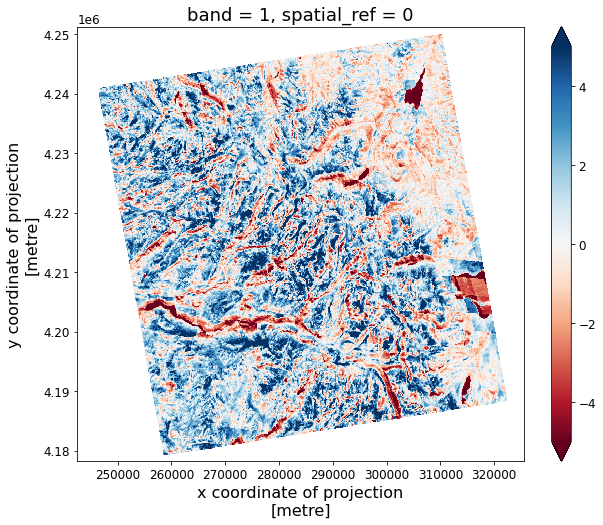

In [22]:
fig, ax = plt.subplots(figsize=(10,8))
diff.plot(ax=ax, vmin=-5, vmax=5, cmap='RdBu')

/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/numpy/lib/histograms.py:829: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/numpy/lib/histograms.py:830: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


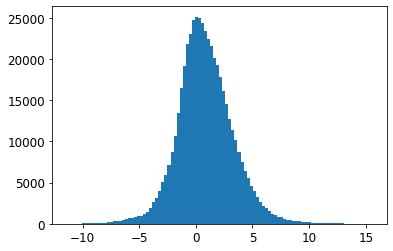

In [34]:
vals = diff.values.flatten()
plt.hist(vals,bins=100);

---

### Try alternate zonal stats method with xarray-spatial

In this method, I need to assign each of the original GOES ABI pixels a uniqie ID to designate each as a "zone"... I think I can use the x,y scan angles as an ID. Which means the geotiffs need to retain that information from the GOES ortho NetCDFs

In [35]:
zones = xr.DataArray(np.array(goes_img_degC.values, dtype=np.integer), name='zones')

In [36]:
### Compute zonal stats
zonalstats = xrs.zonal.stats(zones, aster_tb_degC, stat_funcs=['mean', 'max', 'min', 'std', 'var', 'count'])

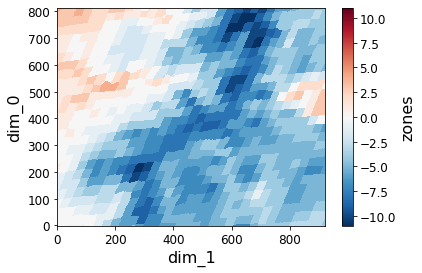

In [37]:
zones.plot()

In [26]:
zonalstats

,mean,max,min,std,var,count
-9223372036854775808,20.6676,25.3669,17.205,1.32433,1.75386,375.0
1,1.12453,23.4369,-4.52779,2.10492,4.43067,34913.0
2,1.52947,23.1587,-4.68224,2.32059,5.38515,46516.0
3,1.85053,20.3412,-3.50444,2.19546,4.82004,45973.0
4,2.30595,27.2675,-3.75925,3.23934,10.4933,48775.0
5,3.93564,32.1773,-3.75925,5.21426,27.1885,30621.0
6,3.77818,27.5367,-3.09814,4.00735,16.0588,19882.0
7,3.8376,27.9968,-2.79454,4.09755,16.7899,22092.0
8,5.80152,30.3484,-3.19955,5.7099,32.6029,22349.0
9,6.4069,29.3296,-2.89563,6.26155,39.207,13692.0


In [41]:
def mapZonalStats(zones, zonalstats, stat_name):

    # create an empty array for this summary stat
    zonal_stat = np.zeros_like(zones.values)

    # for each zone
    for zone_n in zonalstats.dim_0.values:
        print(zone_n)
        # get the summary stat for that zone, 
        # and assign it to the correct locations in the zonal_stat array
        print(zonalstats['{}'.format(stat_name)][zone_n-1])
        zonal_stat[zones.values==zone_n] = zonalstats[str(stat_name)][zone_n-1]

    # convert this to an xarray data array with the proper name
    zonal_stat_da = xr.DataArray(zonal_stat, name='zonal_{}'.format(stat_name))
    
    return zonal_stat_da

In [42]:
zonalstats = xr.Dataset(zonalstats)

In [43]:
zones

<xarray.DataArray 'zones' (dim_0: 812, dim_1: 922)>
array([[ 0,  0,  0, ..., -4, -4, -4],
       [ 0,  0,  0, ..., -4, -4, -4],
       [ 0,  0,  0, ..., -4, -4, -4],
       ...,
       [ 3,  3,  3, ..., -4, -4, -4],
       [ 3,  3,  3, ..., -4, -4, -4],
       [ 3,  3,  3, ..., -4, -4, -4]])
Dimensions without coordinates: dim_0, dim_1

In [44]:
#zonal_means = mapZonalStats(zones, zonalstats, 'mean')
#zonal_max = mapZonalStats(zones, zonalstats, 'max')
#zonal_min = mapZonalStats(zones, zonalstats, 'min')
#zonal_std = mapZonalStats(zones, zonalstats, 'std')
#zonal_var = mapZonalStats(zones, zonalstats, 'var')
#zonal_count = mapZonalStats(zones, zonalstats, 'count')

In [45]:
#ds = xr.merge([aster_tb_degC, zones, zonal_means, zonal_max, zonal_min, zonal_std, zonal_var, zonal_count])

---

In [32]:
def zonal_stats(aster_filepath, aster_band, goes_filepath, return_masked_array=False):
    '''Calculate zonal statistics for an ASTER TIR geotiff image within each unique pixel from a goes pixel map.'''

    with rio.open(aster_filepath) as src:
        
        # Open the shapefile
        zone_shape = gpd.read_file(shapefile_filepath)

        # Make sure our shapefile is the same CRS as the ASTER TIR image
        zone_shape = zone_shape.to_crs(src.crs)

        # Mask the ASTER TIR image to the area of the shapefile
        try:
            masked_aster_band_DN, mask_transform = mask(dataset=src, 
                                            shapes=zone_shape.geometry,
                                            crop=True,
                                            all_touched=True,
                                            filled=True)
        # Note that we still have a "bands" axis (of size 1) even though there's only one band, we can remove it below
        except ValueError as e: 
            # ValueError when shape doesn't overlap raster
            return
        
        # change data type to float64 so we can fill in DN=0 with NaN values
        masked_aster_band_DN = masked_aster_band_DN.astype('float64')
        masked_aster_band_DN[masked_aster_band_DN==0] = np.nan
                
        # Convert DN to Radiance
        masked_aster_band_rad = tir_dn2rad(masked_aster_band_DN, aster_band)
        
        # Convert Radiance to Brightness Temperature
        masked_aster_band_tb = tir_rad2tb(masked_aster_band_rad, aster_band)
        
        # Remove the extra dimension (bands, we only have one band here)
        masked_aster_band_tb = masked_aster_band_tb.squeeze()
        
        # Get all pixel values in our masked area
        values = masked_aster_band_tb.flatten() # flatten to 1-D
        values = values[~np.isnan(values)] # remove NaN pixel values
        
        
        # Calculate zonal statistics for this area (mean, max, min, std:)
        try:
            masked_aster_band_tb_mean = values.mean()
            masked_aster_band_tb_max = values.max()
            masked_aster_band_tb_min = values.min()
            masked_aster_band_tb_std = values.std()
        except ValueError as e:
            # ValueError when the shapefile is empty I think
            return
        
        if return_masked_array == True:
            return masked_aster_band_tb_mean, masked_aster_band_tb_max, masked_aster_band_tb_min, masked_aster_band_tb_std, masked_aster_band_tb
        else:
            return masked_aster_band_tb_mean, masked_aster_band_tb_max, masked_aster_band_tb_min, masked_aster_band_tb_std

<>:2: DeprecationWarning: invalid escape sequence \d
<>:5: DeprecationWarning: invalid escape sequence \d
<>:107: DeprecationWarning: invalid escape sequence \d
<>:213: DeprecationWarning: invalid escape sequence \d
<>:219: DeprecationWarning: invalid escape sequence \d
<>:2: DeprecationWarning: invalid escape sequence \d
<>:5: DeprecationWarning: invalid escape sequence \d
<>:107: DeprecationWarning: invalid escape sequence \d
<>:213: DeprecationWarning: invalid escape sequence \d
<>:219: DeprecationWarning: invalid escape sequence \d
<>:2: DeprecationWarning: invalid escape sequence \d
<>:5: DeprecationWarning: invalid escape sequence \d
<>:107: DeprecationWarning: invalid escape sequence \d
<>:213: DeprecationWarning: invalid escape sequence \d
<>:219: DeprecationWarning: invalid escape sequence \d
<ipython-input-33-2d076b04267d>:2: DeprecationWarning: invalid escape sequence \d
  x_label = 'CUES Snow-Surface Temp. [$\degree C$]'
<ipython-input-33-2d076b04267d>:5: DeprecationWarning

Got 'NoneType' object is not iterable for ASTER at 2017-04-21 10:51:07+00:00
(likely that the shapefile doesn't intersect the ASTER image)


/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/ipykernel_launcher.py:64: DeprecationWarning: parsing timezone aware datetimes is deprecated; this will raise an error in the future
/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/ipykernel_launcher.py:65: DeprecationWarning: parsing timezone aware datetimes is deprecated; this will raise an error in the future
/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/ipykernel_launcher.py:118: DeprecationWarning: parsing timezone aware datetimes is deprecated; this will raise an error in the future
/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/ipykernel_launcher.py:119: DeprecationWarning: parsing timezone aware datetimes is deprecated; this will raise an error in the future
/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/xarray/backends/rasterio_.py:260: DeprecationWarning: Right multiplication will be prohibited in vers

Got 'NoneType' object is not iterable for ASTER at 2017-06-06 22:07:19+00:00
(likely that the shapefile doesn't intersect the ASTER image)


/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/ipykernel_launcher.py:64: DeprecationWarning: parsing timezone aware datetimes is deprecated; this will raise an error in the future
/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/ipykernel_launcher.py:65: DeprecationWarning: parsing timezone aware datetimes is deprecated; this will raise an error in the future
/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/ipykernel_launcher.py:118: DeprecationWarning: parsing timezone aware datetimes is deprecated; this will raise an error in the future
/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/ipykernel_launcher.py:119: DeprecationWarning: parsing timezone aware datetimes is deprecated; this will raise an error in the future
/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/xarray/backends/rasterio_.py:260: DeprecationWarning: Right multiplication will be prohibited in vers

Got 'NoneType' object is not iterable for ASTER at 2017-11-06 22:01:15+00:00
(likely that the shapefile doesn't intersect the ASTER image)


/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/ipykernel_launcher.py:64: DeprecationWarning: parsing timezone aware datetimes is deprecated; this will raise an error in the future
/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/ipykernel_launcher.py:65: DeprecationWarning: parsing timezone aware datetimes is deprecated; this will raise an error in the future
/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/ipykernel_launcher.py:118: DeprecationWarning: parsing timezone aware datetimes is deprecated; this will raise an error in the future
/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/ipykernel_launcher.py:119: DeprecationWarning: parsing timezone aware datetimes is deprecated; this will raise an error in the future
/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/xarray/backends/rasterio_.py:260: DeprecationWarning: Right multiplication will be prohibited in vers

Got 'NoneType' object is not iterable for ASTER at 2017-11-29 22:07:22+00:00
(likely that the shapefile doesn't intersect the ASTER image)


/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/ipykernel_launcher.py:64: DeprecationWarning: parsing timezone aware datetimes is deprecated; this will raise an error in the future
/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/ipykernel_launcher.py:65: DeprecationWarning: parsing timezone aware datetimes is deprecated; this will raise an error in the future
/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/ipykernel_launcher.py:118: DeprecationWarning: parsing timezone aware datetimes is deprecated; this will raise an error in the future
/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/ipykernel_launcher.py:119: DeprecationWarning: parsing timezone aware datetimes is deprecated; this will raise an error in the future
/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/xarray/backends/rasterio_.py:260: DeprecationWarning: Right multiplication will be prohibited in vers

/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/geopandas/plotting.py:433: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.draw()
/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/geopandas/plotting.py:433: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.draw()
/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/ipykernel_launcher.py:64: DeprecationWarning: parsing timezone aware datetimes is deprecated; this will raise an error in the future
/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/ipykernel_launcher.py:65: DeprecationWarning: parsing timezone aware datetimes is deprecated; this will raise an error in the future
/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/ipykernel_launcher.py:118: DeprecationWarning: parsing timezone

/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/numpy/lib/histograms.py:829: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/numpy/lib/histograms.py:830: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/xarray/backends/rasterio_.py:260: DeprecationWarning: Right multiplication will be prohibited in version 3.0
  x, _ = (np.arange(nx) + 0.5, np.zeros(nx) + 0.5) * riods.transform
/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/xarray/backends/rasterio_.py:261: DeprecationWarning: Right multiplication will be prohibited in version 3.0
  _, y = (np.zeros(ny) + 0.5, np.arange(ny) + 0.5) * riods.transform
/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/pyproj/crs.py:422: FutureWarning: '+init=<au

/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/pyproj/crs.py:422: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method.
  projstring = _prepare_from_string(projparams)
/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/numpy/lib/histograms.py:829: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/numpy/lib/histograms.py:830: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/xarray/backends/rasterio_.py:260: DeprecationWarning: Right multiplication will be prohibited in version 3.0
  x, _ = (np.arange(nx) + 0.5, np.zeros(nx) + 0.5) * riods.transform
/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/xarray/backends/rasterio_.py:2

Got 'NoneType' object is not iterable for ASTER at 2018-10-17 10:52:00+00:00
(likely that the shapefile doesn't intersect the ASTER image)
Got 'NoneType' object is not iterable for ASTER at 2018-10-31 22:07:55+00:00
(likely that the shapefile doesn't intersect the ASTER image)


/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/ipykernel_launcher.py:118: DeprecationWarning: parsing timezone aware datetimes is deprecated; this will raise an error in the future
/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/ipykernel_launcher.py:119: DeprecationWarning: parsing timezone aware datetimes is deprecated; this will raise an error in the future
/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/xarray/backends/rasterio_.py:260: DeprecationWarning: Right multiplication will be prohibited in version 3.0
  x, _ = (np.arange(nx) + 0.5, np.zeros(nx) + 0.5) * riods.transform
/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/xarray/backends/rasterio_.py:261: DeprecationWarning: Right multiplication will be prohibited in version 3.0
  _, y = (np.zeros(ny) + 0.5, np.arange(ny) + 0.5) * riods.transform
/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/pyproj/crs.

Got 'NoneType' object is not iterable for ASTER at 2018-12-18 22:07:22+00:00
(likely that the shapefile doesn't intersect the ASTER image)


/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/ipykernel_launcher.py:64: DeprecationWarning: parsing timezone aware datetimes is deprecated; this will raise an error in the future
/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/ipykernel_launcher.py:65: DeprecationWarning: parsing timezone aware datetimes is deprecated; this will raise an error in the future
/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/ipykernel_launcher.py:118: DeprecationWarning: parsing timezone aware datetimes is deprecated; this will raise an error in the future
/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/ipykernel_launcher.py:119: DeprecationWarning: parsing timezone aware datetimes is deprecated; this will raise an error in the future
/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/xarray/backends/rasterio_.py:260: DeprecationWarning: Right multiplication will be prohibited in vers

/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/numpy/lib/histograms.py:829: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/numpy/lib/histograms.py:830: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/xarray/backends/rasterio_.py:260: DeprecationWarning: Right multiplication will be prohibited in version 3.0
  x, _ = (np.arange(nx) + 0.5, np.zeros(nx) + 0.5) * riods.transform
/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/xarray/backends/rasterio_.py:261: DeprecationWarning: Right multiplication will be prohibited in version 3.0
  _, y = (np.zeros(ny) + 0.5, np.arange(ny) + 0.5) * riods.transform
/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/pyproj/crs.py:422: FutureWarning: '+init=<au

/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/geopandas/plotting.py:433: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.draw()
/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/geopandas/plotting.py:433: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.draw()


Got 'NoneType' object is not iterable for ASTER at 2019-05-27 22:07:27+00:00
(likely that the shapefile doesn't intersect the ASTER image)


/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/ipykernel_launcher.py:64: DeprecationWarning: parsing timezone aware datetimes is deprecated; this will raise an error in the future
/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/ipykernel_launcher.py:65: DeprecationWarning: parsing timezone aware datetimes is deprecated; this will raise an error in the future
/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/ipykernel_launcher.py:77: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/ipykernel_launcher.py:118: DeprecationWarning: parsing timezone aware datetimes is deprecated; this will raise an error in the future
/home/spestan

/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/pyproj/crs.py:422: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method.
  projstring = _prepare_from_string(projparams)
/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/numpy/lib/histograms.py:829: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/numpy/lib/histograms.py:830: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/xarray/backends/rasterio_.py:260: DeprecationWarning: Right multiplication will be prohibited in version 3.0
  x, _ = (np.arange(nx) + 0.5, np.zeros(nx) + 0.5) * riods.transform
/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/xarray/backends/rasterio_.py:2

Got 'NoneType' object is not iterable for ASTER at 2019-06-12 22:07:22+00:00
(likely that the shapefile doesn't intersect the ASTER image)


/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/ipykernel_launcher.py:64: DeprecationWarning: parsing timezone aware datetimes is deprecated; this will raise an error in the future
/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/ipykernel_launcher.py:65: DeprecationWarning: parsing timezone aware datetimes is deprecated; this will raise an error in the future
/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/ipykernel_launcher.py:77: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/ipykernel_launcher.py:118: DeprecationWarning: parsing timezone aware datetimes is deprecated; this will raise an error in the future
/home/spestan

/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/pyproj/crs.py:422: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method.
  projstring = _prepare_from_string(projparams)
/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/numpy/lib/histograms.py:829: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/numpy/lib/histograms.py:830: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/xarray/backends/rasterio_.py:260: DeprecationWarning: Right multiplication will be prohibited in version 3.0
  x, _ = (np.arange(nx) + 0.5, np.zeros(nx) + 0.5) * riods.transform
/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/xarray/backends/rasterio_.py:2

/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/geopandas/plotting.py:433: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.draw()
/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/geopandas/plotting.py:433: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.draw()
/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/ipykernel_launcher.py:64: DeprecationWarning: parsing timezone aware datetimes is deprecated; this will raise an error in the future
/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/ipykernel_launcher.py:65: DeprecationWarning: parsing timezone aware datetimes is deprecated; this will raise an error in the future
/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/ipykernel_launcher.py:77: RuntimeWarning: More than 20 figures 

/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/pyproj/crs.py:422: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method.
  projstring = _prepare_from_string(projparams)
/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/numpy/lib/histograms.py:829: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/numpy/lib/histograms.py:830: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/xarray/backends/rasterio_.py:260: DeprecationWarning: Right multiplication will be prohibited in version 3.0
  x, _ = (np.arange(nx) + 0.5, np.zeros(nx) + 0.5) * riods.transform
/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/xarray/backends/rasterio_.py:2

Got 'NoneType' object is not iterable for ASTER at 2020-01-06 22:06:50+00:00
(likely that the shapefile doesn't intersect the ASTER image)


/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/ipykernel_launcher.py:64: DeprecationWarning: parsing timezone aware datetimes is deprecated; this will raise an error in the future
/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/ipykernel_launcher.py:65: DeprecationWarning: parsing timezone aware datetimes is deprecated; this will raise an error in the future
/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/ipykernel_launcher.py:77: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/ipykernel_launcher.py:118: DeprecationWarning: parsing timezone aware datetimes is deprecated; this will raise an error in the future
/home/spestan

Got 'NoneType' object is not iterable for ASTER at 2020-01-22 22:07:07+00:00
(likely that the shapefile doesn't intersect the ASTER image)
Got 'NoneType' object is not iterable for ASTER at 2020-01-31 22:01:09+00:00
(likely that the shapefile doesn't intersect the ASTER image)
Got 'NoneType' object is not iterable for ASTER at 2020-02-07 22:07:29+00:00
(likely that the shapefile doesn't intersect the ASTER image)


/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/ipykernel_launcher.py:64: DeprecationWarning: parsing timezone aware datetimes is deprecated; this will raise an error in the future
/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/ipykernel_launcher.py:65: DeprecationWarning: parsing timezone aware datetimes is deprecated; this will raise an error in the future
/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/ipykernel_launcher.py:77: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/ipykernel_launcher.py:118: DeprecationWarning: parsing timezone aware datetimes is deprecated; this will raise an error in the future
/home/spestan

/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/pyproj/crs.py:422: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method.
  projstring = _prepare_from_string(projparams)
/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/numpy/lib/histograms.py:829: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/numpy/lib/histograms.py:830: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/xarray/backends/rasterio_.py:260: DeprecationWarning: Right multiplication will be prohibited in version 3.0
  x, _ = (np.arange(nx) + 0.5, np.zeros(nx) + 0.5) * riods.transform
/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/xarray/backends/rasterio_.py:2

/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/geopandas/plotting.py:433: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.draw()
/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/geopandas/plotting.py:433: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.draw()
/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/ipykernel_launcher.py:64: DeprecationWarning: parsing timezone aware datetimes is deprecated; this will raise an error in the future
/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/ipykernel_launcher.py:65: DeprecationWarning: parsing timezone aware datetimes is deprecated; this will raise an error in the future
/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/ipykernel_launcher.py:77: RuntimeWarning: More than 20 figures 

/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/pyproj/crs.py:422: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method.
  projstring = _prepare_from_string(projparams)
/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/numpy/lib/histograms.py:829: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/numpy/lib/histograms.py:830: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/xarray/backends/rasterio_.py:260: DeprecationWarning: Right multiplication will be prohibited in version 3.0
  x, _ = (np.arange(nx) + 0.5, np.zeros(nx) + 0.5) * riods.transform
/home/spestana/opt/anaconda3/envs/goes-linux/lib/python3.6/site-packages/xarray/backends/rasterio_.py:2

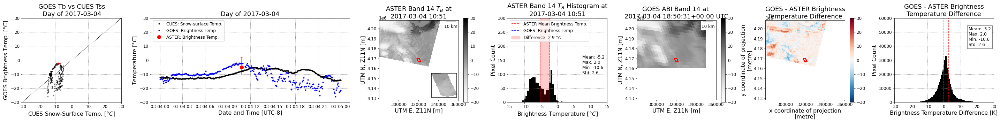

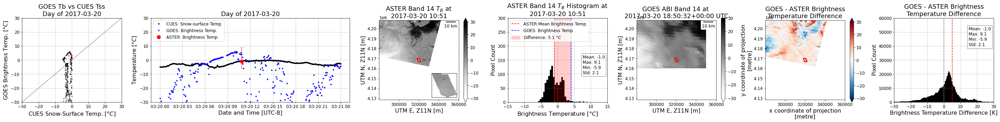

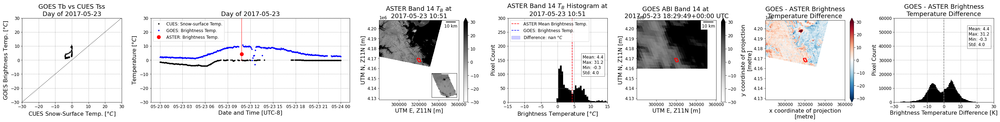

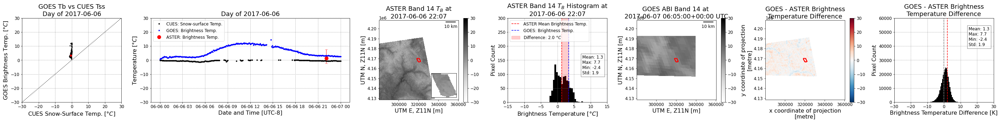

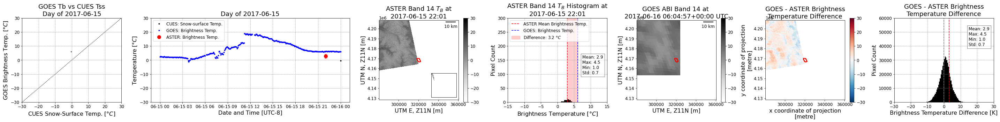

...

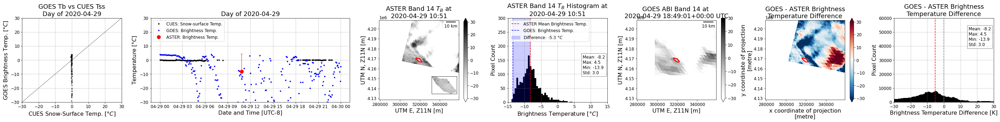

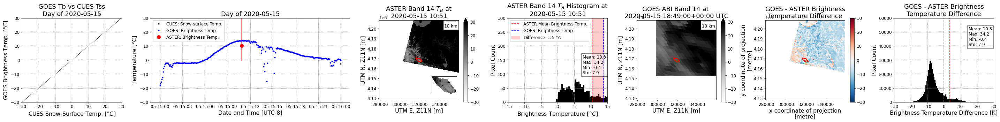

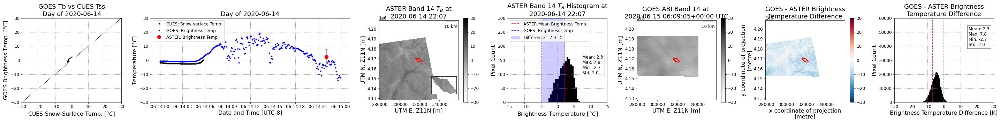

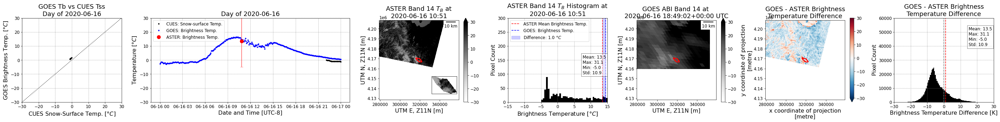

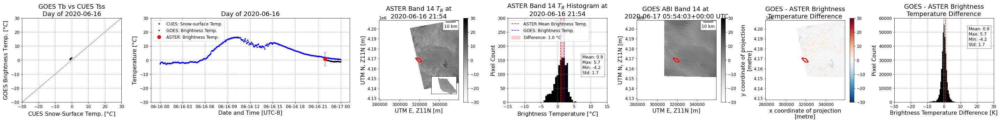

In [33]:
x = cues_ds['snow surface temperature; Apogee SI-111 thermal radiometer; (Celsius)']
x_label = 'CUES Snow-Surface Temp. [$\degree C$]'

y = cues_ds.goes_tb_c
y_label = 'GOES Brightness Temp. [$\degree C$]'

t = cues_ds.datetime

snowdepth = cues_ds['snow depth  remote boom;  ultrasonic depth pinger on remote boom; (cm)']

aster_band = 14

# initialize the orbit_change_flag to false until GOES-16 changes orbits
orbit_change_flag = False

for index, row in aster.iterrows():
    
    
    
    
    # Get the filepath to the ASTER image
    single_filepath = os.path.normpath(row.filepath)    
    # Get the datetime of the ASTER image
    single_datetime = row.datetime
    # Get the beginning of the day
    startdate = pd.Timestamp(single_datetime.strftime("%Y-%m-%d"))
    # Get the end of the day
    enddate = startdate + pd.Timedelta(hours=24)
       
    
    
    ### Compute zonal statistics with on the ASTER image ###
    # GOES-16 changed orbital slots in late 2017, choose the corresponding GOES pixel footprint
    if (startdate < pd.Timestamp(year=2017,month=12,day=1)) and (orbit_change_flag==False):
        # Before December 2017, GOES-16 was at about -89 longitude
        # load the GOES pixel footprint shapefile for this orbital position
        shapefile_filepath = "shapefiles/CUES_lon_89_west.shp"
        zone_shape = gpd.read_file(shapefile_filepath)
    else:
        # Since December 2017, GOES-16 has been at about -75 longitude (GOES-East slot)
        # load the GOES pixel footprint shapefile for this orbital position
        shapefile_filepath = "shapefiles/CUES_lon_75_west.shp"
        zone_shape = gpd.read_file(shapefile_filepath)
        # set the orbit_change_flag to true so we don't load the shapefile again
        orbit_change_flag = True
    # Try to compute zonal statistics
    try:
        aster_mean, aster_max, aster_min, aster_std, masked_aster_tb = aster_utils.zonal_stats(single_filepath, 
                                                                                               aster_band,
                                                                                               shapefile_filepath,
                                                                                               return_masked_array=True)
    except TypeError as e:
        # we can get a "TypeError 'NoneType' object is not iterable" when shapefile doesn't overlap raster
        print("Got {} for ASTER at {}\n(likely that the shapefile doesn't intersect the ASTER image)".format(e, aster.datetime[index]))
        continue    
    ######
    
    
    
    ### select a single 24-hour period from our data
    _x = x.sel(datetime=slice(startdate, enddate))
    _y = y.sel(datetime=slice(startdate, enddate))
    # Find the nearest data points to when our ASTER image was taken
    _x_nearest_aster = x.sel(datetime=np.datetime64(single_datetime),method='nearest')
    _y_nearest_aster = y.sel(datetime=np.datetime64(single_datetime),method='nearest')
    #print(_x_nearest_aster.values,_y_nearest_aster.values)
    _t = t.sel(datetime=slice(startdate, enddate))
    _snowdepth = snowdepth.sel(datetime=slice(startdate, enddate))
    ######
    
    
    
    ### Set up plot
    fig, ax = plt.subplots(nrows=1, ncols=7, 
                           figsize=(40,5),
                           tight_layout=True,
                           gridspec_kw={'width_ratios': [1, 2, 1, 1, 1, 1, 1]})
    #fig.suptitle('{}'.format(single_datetime.strftime("%Y-%m-%d")))
    ######
    
    
    ### Plot GOES Tb versus CUES Tss
    ax[0].plot(_x,_y,'.',color='k',markersize=5,alpha=0.5)
    # Highlight the datpoint that coincides with ASTER flying overhead
    ax[0].plot(_x_nearest_aster,_y_nearest_aster,'o',color='r',markersize=5,alpha=1)
    # Plot 1-to-1 line
    ax[0].plot([-30,30],[-30,30],':k')
    # add gridlines
    ax[0].grid(color='grey', linestyle=':', linewidth=1)
    # Set axes limits
    ax[0].set_xlim([-30,30])
    ax[0].set_ylim([-30,30])
    # Set axes labels, plot title
    ax[0].set_ylabel(y_label)
    ax[0].set_xlabel(x_label)
    ax[0].set_title('GOES Tb vs CUES Tss\nDay of {}'.format(single_datetime.strftime("%Y-%m-%d")))
    ######
    
    
    ### Plot timeseries of both
    ax[1].set_title('Day of {}'.format(single_datetime.strftime("%Y-%m-%d")))
    ax[1].grid(color='grey', linestyle=':', linewidth=1)
    ax[1].plot(_t, _x, '.k')
    ax[1].plot(_t, _y, '.b')
    #ax[1].axvline(single_datetime,linestyle='--',color='r')
    ax[1].set_ylim([-30,30])
    ax[1].set_ylabel("Temperature [$\degree C$]")
    ax[1].set_xlabel("Date and Time [UTC-8]")
    ## plot snowdepth
    #ax2 = ax[1].twinx()
    #ax2.plot(_t, _snowdepth, '.', c='tab:grey')
    #ax2.set_ylim([0,600])
    #ax2.set_ylabel("Snow Depth [cm]")
    ######
    
    
    ### add ASTER zonal stats data to timeline plot
    ax[1].plot(np.datetime64(single_datetime),aster_mean-273.15,'o',color='r',markersize=10,label='ASTER Tb mean')
    ax[1].errorbar(np.datetime64(single_datetime),aster_mean-273.15,
                 yerr=[[np.abs(aster_min-aster_mean)],[np.abs(aster_max-aster_mean)]],
                 linestyle='-',c='r',linewidth=2,capsize=4,alpha=0.5)#,
                 #label='ASTER LST Range')
    # make legend for the timeline plot
    lines = [ax[1].lines[0], ax[1].lines[1], ax[1].lines[2]]
    labels = ['CUES: Snow-surface Temp.', 'GOES: Brightness Temp.', 
              'ASTER: Brightness Temp.', 'ASTER: Min - Max $T_B$']
    ax[1].legend(lines, labels, loc='upper left')
    ######


    
    
    
    ### Open the ASTER image
    aster_src = xr.open_rasterio(single_filepath)
    # Replace the nodatavals with NaN
    aster_src = aster_src.where(aster_src!=aster_src.nodatavals, np.nan)
    # Convert ASTER DN to Radiance, and then Brightness Temperature
    aster_rad = aster_utils.tir_dn2rad(aster_src, aster_band)
    aster_tb =  aster_utils.tir_rad2tb(aster_rad, aster_band)
    aster_tb_degC = aster_tb-273.15
    ######
    
    

    ### plot ASTER image
    aster_tb_degC.plot(ax=ax[2], cmap='Greys', vmin=-30, vmax=30)
    # set labels
    ax[2].set_ylabel('UTM N, Z11N [m]')
    ax[2].set_xlabel('UTM E, Z11N [m]')
    ax[2].set_title('ASTER L1T Band 14')
    # Add scalebar
    scalebar = ScaleBar(1, length_fraction=0.15) # get image resolution from original raster image (1 pixel = X meters)
    ax[2].add_artist(scalebar) 
    # Plot shapefile outline
    zone_shape = zone_shape.to_crs(aster_src.crs)
    zone_shape.plot(ax=ax[2], color="none", ec='red', linewidth=2, linestyle='-', alpha=1)
    # Center this plot on the shapefile
    center_x = zone_shape.geometry.centroid.x.values[0]
    center_y = zone_shape.geometry.centroid.y.values[0]
    ax[2].set_xlim([center_x-40000, center_x+40000])
    ax[2].set_ylim([center_y-40000, center_y+40000])
    # Set the title for this ASTER plot
    title_text = 'ASTER Band 14 $T_B$ at\n{}'.format(aster.datetime[index].strftime("%Y-%m-%d %H:%M"))
    ax[2].set_title(title_text)
    ######
    
    
    
    ### Plot ASTER image cropped to shapefile
    aster_inset_ax = inset_axes(ax[2],
                                width=1,
                                height=1,
                                loc=4)
    rio.plot.show(masked_aster_tb-273.15,
                  ax=aster_inset_ax,
                  cmap='Greys',
                  vmin=-30, vmax=30)
    #scalebar = ScaleBar(src.res[0]) # get image resolution from original raster image
    #aster_inset_ax.add_artist(scalebar)
    aster_inset_ax.tick_params(axis='both', bottom=False, top=False, left=False, right=False)
    aster_inset_ax.xaxis.set_ticklabels([])
    aster_inset_ax.yaxis.set_ticklabels([])
    ######
    
    
    ### Plot histogram and summary statistics
    if aster_mean is not None:
        summary_stats = 'Mean: {}\nMax: {}\nMin: {}\nStd: {}'.format(np.round(aster_mean-273.15,1),
                                                                     np.round(aster_max-273.15,1),
                                                                     np.round(aster_min-273.15,1),
                                                                     np.round(aster_std,1))
    
        ax[3].grid(color='grey', linestyle=':', linewidth=1)
        # flattened array to make a histogram
        mased_aster_tb_values = masked_aster_tb.flatten()
        # set up the number of bins to have a width of 0.5 degree (have to remove nans first)
        mased_aster_tb_values_nonan = mased_aster_tb_values[~np.isnan(mased_aster_tb_values)]
        bin_width = 0.5
        n_bins = int(np.round((mased_aster_tb_values_nonan.max() - mased_aster_tb_values_nonan.min())/bin_width, 0)) if len(mased_aster_tb_values_nonan)>0 else 50
        # plot the histogram
        ax[3].hist(mased_aster_tb_values-273.15, bins=n_bins, facecolor='k');
        aster_mean_line = ax[3].axvline(x=aster_mean-273.15, c='r', linestyle='--') # ASTER mean Tb
        goes_line = ax[3].axvline(x=_y_nearest_aster, c='b', linestyle='--') # GOES pixel Tb
        # difference between ASTER mean Tb and GOES Tb (GOES - ASTER)
        tb_diff = _y_nearest_aster.values - (aster_mean-273.15)
        spancolor = 'red' if tb_diff > 1 else 'blue' # conditional fill color if GOES is > or < ASTER mean
        difference_span = ax[3].axvspan(aster_mean-273.15, _y_nearest_aster, alpha=0.2, color=spancolor) # area between ASTER mean Tb and GOES pixel Tb
        ax[3].set_xlim([-15,15])
        ax[3].set_ylim([0,300])
        ax[3].text(7.5,100,summary_stats, bbox=dict(facecolor='white', alpha=0.5))
        ax[3].set_ylabel('Pixel Count')
        ax[3].set_xlabel('Brightness Temperature [$\degree C$]')
        title_text_hist = 'ASTER Band 14 $T_B$ Histogram at\n{}'.format(aster.datetime[index].strftime("%Y-%m-%d %H:%M"))
        ax[3].set_title(title_text_hist)
        # make legend for the histogram plot
        lines = [aster_mean_line, goes_line, difference_span]
        labels = ['ASTER Mean Brightness Temp.', 'GOES: Brightness Temp.', 
                  'Difference: {} $\degree C$'.format(np.round(tb_diff,1))]
        ax[3].legend(lines, labels, loc='upper left')
        ######
    
    

        
        
        
        
        ### Get GOES image
        # Find the GOES image closest to our ASTER observation
        nearest_goes_datetime_UTC = nearest(list(goes_dict.keys()), row.timestampUTC)
        #print('\t{} -- {}'.format(aster_datetime_UTC, nearest_goes_datetime_UTC))
        nearest_goes_filepath = goes_dict[nearest_goes_datetime_UTC]['filepath']
        # Open the GOES file
        goes_src = xr.open_rasterio(nearest_goes_filepath)
        # use Reproject_Match to reproject the GOES geotiff into the same CRS as the ASTER geotiff
        goes_src_repr_match = goes_src.rio.reproject_match(aster_src)
        ######
        
        ### plot GOES image
        goes_img_degC = goes_src_repr_match.squeeze()-273.15
        goes_img_degC.plot(ax=ax[4], cmap='Greys', vmin=-30, vmax=30)
        ## set labels
        ax[4].set_ylabel('UTM N, Z11N [m]')
        ax[4].set_xlabel('UTM E, Z11N [m]')
        ax[4].set_title('GOES ABI Band 14 at \n{} UTC'.format(nearest_goes_datetime_UTC))
        ## Add scalebar
        scalebar = ScaleBar(1, length_fraction=0.15) # get image resolution from original raster image (1 pixel = X meters)
        ax[4].add_artist(scalebar) 
        ## Plot shapefile outline
        zone_shape.plot(ax=ax[4], color="none", ec='red', linewidth=2, linestyle='-', alpha=1)
        ## Center this plot on the shapefile
        ax[4].set_xlim([center_x-40000, center_x+40000])
        ax[4].set_ylim([center_y-40000, center_y+40000])
        ######
        
        ### GOES-ASTER difference
        # Subtract GOES - ASTER ~11 micron band Brightness Temperature
        goes_aster_difference = goes_src_repr_match - aster_tb
        # Plot difference image
        goes_aster_difference.plot(ax=ax[5], cmap='RdBu_r', vmin=-30, vmax=30)
        ## Plot shapefile outline
        zone_shape.plot(ax=ax[5], color="none", ec='red', linewidth=2, linestyle='-', alpha=1)
        ## Center this plot on the shapefile
        ax[5].set_xlim([center_x-40000, center_x+40000])
        ax[5].set_ylim([center_y-40000, center_y+40000])
        ax[5].set_title('GOES - ASTER Brightness\nTemperature Difference')
        ######
        
        ### Plot difference histogram and stats
        ax[6].grid(color='grey', linestyle=':', linewidth=1)
        # flattened array to make a histogram
        goes_aster_difference_flat = goes_aster_difference.values.flatten()
        # set up the number of bins to have a width of 0.5 degree (have to remove nans first)
        goes_aster_difference_flat_nonan = goes_aster_difference_flat[~np.isnan(goes_aster_difference_flat)]
        bin_width = 0.5
        n_bins = int(np.round((goes_aster_difference_flat_nonan.max() - goes_aster_difference_flat_nonan.min())/bin_width, 0)) if len(goes_aster_difference_flat_nonan)>0 else 50
        # plot the histogram
        ax[6].hist(goes_aster_difference_flat_nonan, bins=n_bins, facecolor='k');
        ax[6].axvline(0,color='grey',linestyle='--')
        ax[6].axvline(tb_diff,color='r',linestyle='--')
        ax[6].set_xlim([-30,30])
        ax[6].set_ylim([0,60000])
        ax[6].set_title('GOES - ASTER Brightness\nTemperature Difference')
        ax[6].set_ylabel('Pixel Count')
        ax[6].set_xlabel('Brightness Temperature Difference [K]')
        # mean, median, min, max, std
        diff_summary_stats = 'Mean: {}\nMax: {}\nMin: {}\nStd: {}'.format(np.round(goes_aster_difference_flat_nonan.mean(),1),
                                                                          np.round(goes_aster_difference_flat_nonan.max(),1),
                                                                          np.round(goes_aster_difference_flat_nonan.min(),1),
                                                                          np.round(goes_aster_difference_flat_nonan.std(),1))
        ax[6].text(15,40000,summary_stats, bbox=dict(facecolor='white', alpha=0.5))
        ######
        
        
    #plt.savefig('images/tuol/{}.jpg'.format(aster.datetime[index].strftime("%Y-%m-%dT%H%M")))